In [20]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm
sia = SentimentIntensityAnalyzer()

In [11]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/subha/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Train and Test Data

In [13]:
import pandas as pd
X_test_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/test_data_sample/', engine='pyarrow' )
X_train_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/train_data_sample/', engine='pyarrow' )
X_val_ = pd.read_parquet('/home/subha/aiwork/project/output/cleandata/val_data_sample/', engine='pyarrow' )

## Polarity Score

In [98]:
def polarity_score(df):
    # Run the polarity score on the entire dataset
    res = {}
    for i, row in tqdm(df.iterrows()):
        text = row['cleaned_text']
        myid = i
        res[myid] = sia.polarity_scores(text)
    vaders = pd.DataFrame(res).T
    vaders = vaders.join(df, how='left')
    return vaders

In [104]:
X_train_pol = polarity_score(X_train_)

0it [00:00, ?it/s]

In [103]:
X_test_pol = polarity_score(X_test_)

0it [00:00, ?it/s]

In [102]:
X_val_pol = polarity_score(X_val_)

0it [00:00, ?it/s]

In [105]:
X_test_pol

,neg,neu,pos,compound,cleaned_text,sentiment
0,0.079,0.910,0.011,-0.7891,do not purchase this thermometer this thermome...,0
1,0.030,0.865,0.105,0.7948,smileit never really was to those of us that w...,0
2,0.000,0.978,0.022,0.3818,this is not it this is not it g barto reviewer...,0
3,0.157,0.634,0.209,0.3919,star because of the book was good the first th...,0
4,0.056,0.890,0.053,-0.0772,and the band played on should be pulled from t...,0
...,...,...,...,...,...,...
20050,0.054,0.585,0.361,0.9119,you dont know what youre missing certainly a g...,1
20051,0.031,0.753,0.215,0.9660,youll enjoy this cd you dont have to be a bsb ...,1
20052,0.024,0.742,0.234,0.9636,the best of the star trek movies the long awai...,1
20053,0.000,0.770,0.230,0.9859,cute this is my rd my scene doll and im very h...,1


## WordCloud

In [64]:
from wordcloud import WordCloud
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color='black',
        max_words=200,
        max_font_size=40,
        scale=1,
        random_state=1
).generate(" ".join(data))

    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)

    plt.imshow(wordcloud)
    plt.show()

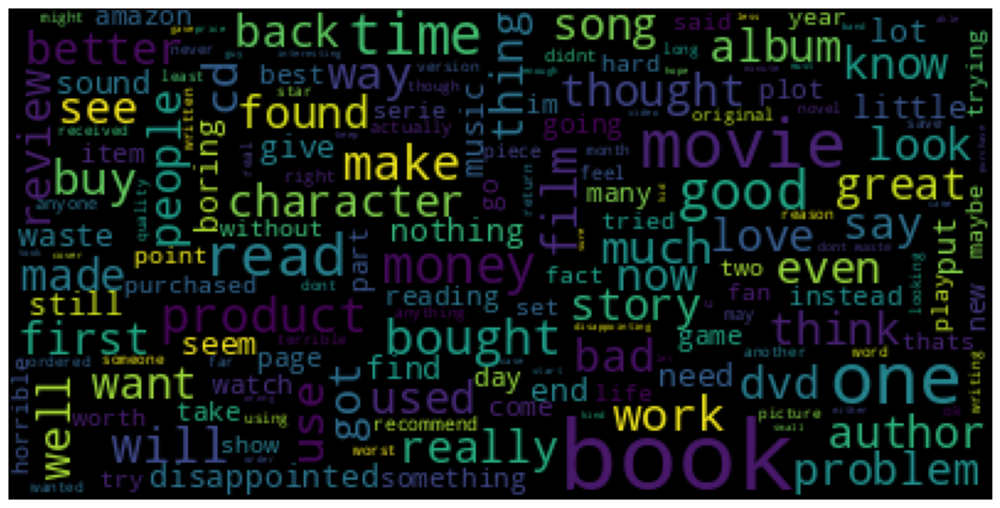

In [75]:
show_wordcloud(X_train_[X_train_['sentiment'] == '0']["cleaned_text"].values)

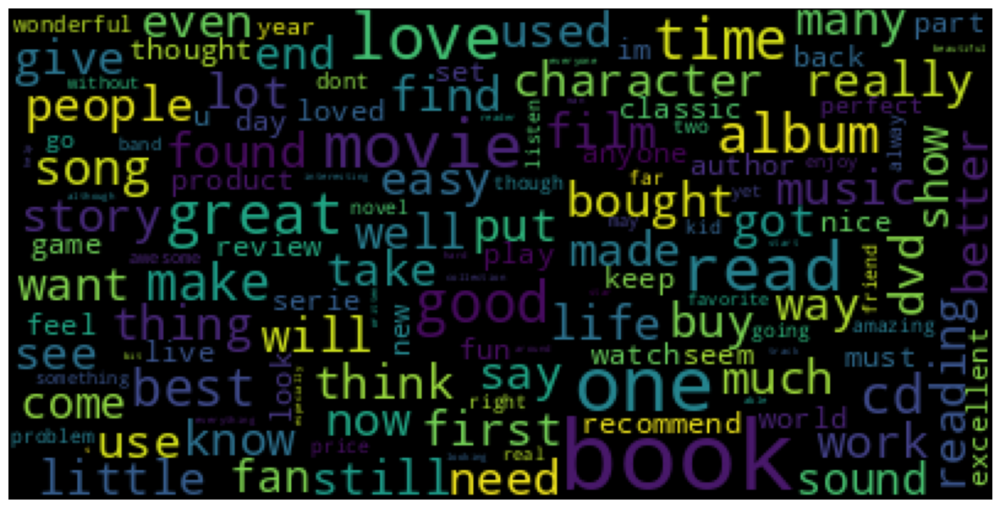

In [76]:
show_wordcloud(X_train_[X_train_['sentiment'] == '1']["cleaned_text"].values)

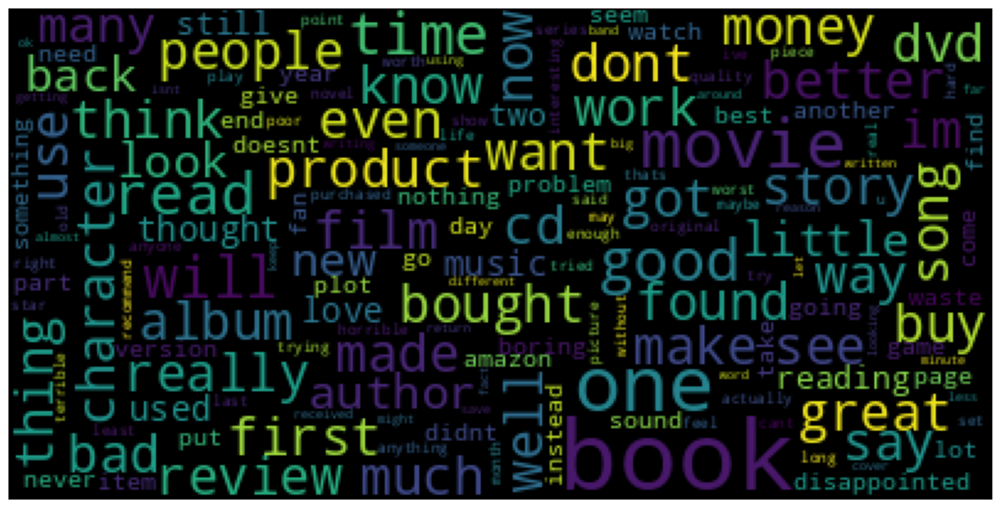

In [78]:
show_wordcloud(X_val_[X_val_['sentiment'] == '0']["cleaned_text"].values)

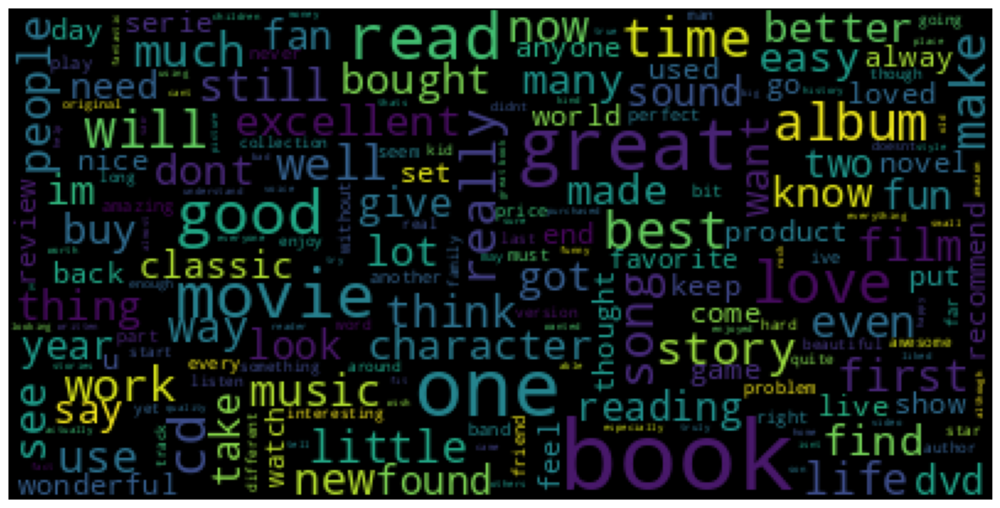

In [79]:
show_wordcloud(X_val_[X_val_['sentiment'] == '1']["cleaned_text"].values)

## Word Frequency

In [92]:
from collections import Counter, defaultdict
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stopWords_nltk = set(stopwords.words('english'))
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import plot

texts = X_val_[X_val_['sentiment'] == '1']["cleaned_text"]
new = texts.str.split()
new = new.values.tolist()
corpus = [word for i in new for word in i]
counter = Counter(corpus)
most = counter.most_common()
x, y = [], []
for word, count in most[:100]:
    if word not in stopWords_nltk:
        x.append(word)
        y.append(count)

fig = go.Figure(go.Bar(
            x=y,
            y=x,
            orientation='h',  marker=dict(
        color='rgba(50, 171, 96, 0.6)',
        line=dict(
            color='rgba(50, 171, 96, 1.0)',
            width=1),
    ),
    name='Most common Word',))

fig.update_layout( title={
        'text': "Most Common Words Positive Reviews",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ))

fig.show()

[nltk_data] Downloading package stopwords to /home/subha/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [91]:
texts = X_val_[X_val_['sentiment'] == '0']["cleaned_text"]
new = texts.str.split()
new = new.values.tolist()
corpus = [word for i in new for word in i]
counter = Counter(corpus)
most = counter.most_common()
x, y = [], []
for word, count in most[:100]:
    if word not in stopWords_nltk:
        x.append(word)
        y.append(count)

fig = go.Figure(go.Bar(
            x=y,
            y=x,
            orientation='h',  marker=dict(
        color='rgba(50, 171, 96, 0.6)',
        line=dict(
            color='rgba(50, 171, 96, 1.0)',
            width=1),
    ),
    name='Most common Word',))

fig.update_layout( title={
        'text': "Most Common Words Negative Reviews",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}, font=dict(
        family="Courier New, monospace",
        size=18,
        color="RebeccaPurple"
    ))

fig.show()

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns

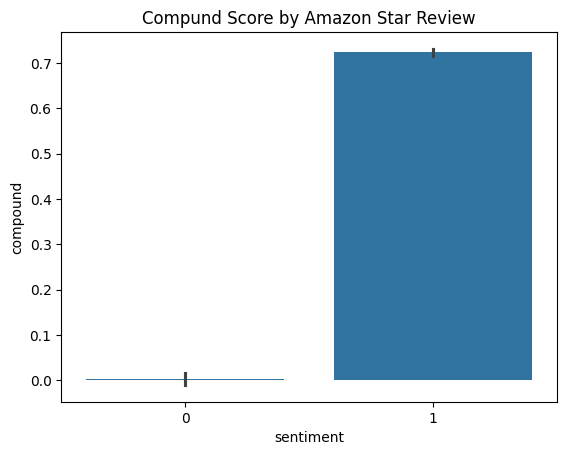

In [57]:
ax = sns.barplot(data=vaders, x='sentiment', y='compound')
ax.set_title('Compund Score by Amazon Star Review')
plt.show()